Processing Steps:
- Detects keypoints and computes descriptors using the Scale-Invariant Feature Transform (SIFT) algorithm on the given image.
- Matches descriptors from a logo image and a scene image using the FLANN-based matcher.
- Applies the ratio test to filter good matches from the list of matches.
- Finds the homography matrix using the good matches between the keypoints of the logo and scene images.

The main function `remove_logo()` loads the input image and the logo image specified by the provided paths. It then converts the input image to grayscale and detects keypoints and computes descriptors using (SIFT) algorithm for both the logo and scene images. The descriptors are then matched, and a ratio test is applied to filter good matches. If a sufficient number of good matches are found, a homography matrix is calculated using RANSAC. With the homography matrix, the logo's position in the scene image is determined, and a mask is created to isolate the logo region. The logo region is inpainted and blurred to remove itfrom the scene image. Finally, the modified scene image is saved to the specified output path.

Steps involved in SIFT algorithm :

- Scale-space detection: Generate a series of images with progressively reduced resolution and different levels of Gaussian blur, Compute the Difference of Gaussians (DoG) for adjacent blurred images and Identify local extrema in the DoG images.
- Keypoint Localization: Accurately locating the feature keypoints.
- Orientation Assignment: Assigning orientation to keypoints.
- Keypoint descriptor: Describing the keypoints as a high dimensional vector.
- Keypoint Matching


### Imports and installations

In [ ]:
!pip install opencv-python numpy matplotlib Pillow

In [1]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import math
from PIL import Image
import os
import glob

### Final Function

In [2]:
def load_images(input_image_path, logo_image_path):
    """
    Loads the input image and logo image from the specified file paths.

    Args:
        input_image_path (str): The file path to the input image.
        logo_image_path (str): The file path to the logo image.

    Returns:
        tuple: A tuple containing two elements:
            - image (numpy.ndarray): The loaded input image.
            - logo_image (numpy.ndarray): The loaded logo image in grayscale.

    Raises:
        FileNotFoundError: If the input image or logo image file does not exist at the specified path.
    """
    if not os.path.isfile(input_image_path):
        raise FileNotFoundError(f"Input image not found: {input_image_path}")
    if not os.path.isfile(logo_image_path):
        raise FileNotFoundError(f"Logo image not found: {logo_image_path}")

    logo_image = cv2.imread(logo_image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.imread(input_image_path)
    return image, logo_image


In [3]:
def detect_and_compute_sift(image):
    """
    Detects keypoints and computes descriptors using the SIFT algorithm on the given image.

    Args:
        image (numpy.ndarray): The input image on which to detect keypoints and compute descriptors.

    Returns:
        tuple: A tuple containing two elements:
            - keypoints (list of cv2.KeyPoint): A list of detected keypoints.
            - descriptors (numpy.ndarray): An array of computed descriptors.
    """
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(image, None)
    return keypoints, descriptors


In [4]:
def match_descriptors(descriptors_logo, descriptors_scene):
    """
    Matches descriptors from a logo image and a scene image using the FLANN-based matcher.

    Args:
        descriptors_logo (numpy.ndarray): The descriptors from the logo image.
        descriptors_scene (numpy.ndarray): The descriptors from the scene image.

    Returns:
        list of lists of cv2.DMatch: A list of lists, where each sublist contains the best two matches for each descriptor in the logo image.

    """
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors_logo, descriptors_scene, k=2)
    return matches


In [5]:
def apply_ratio_test(matches, ratio=0.75):
    """
    Applies the ratio test to filter good matches from the list of matches.

    Args:
        matches (list of lists of cv2.DMatch): The list of matches, where each sublist contains two matches.
        ratio (float, optional): The ratio threshold for the test. Default is 0.75.

    Returns:
        list of cv2.DMatch: A list of good matches that pass the ratio test.

    """
    good_matches = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good_matches.append(m)
    return good_matches


In [6]:
def find_homography(good_matches, keypoints_logo, keypoints_scene):
    """
    Finds the homography matrix using the good matches between the keypoints of the logo and scene images.

    Args:
        good_matches (list of cv2.DMatch): A list of good matches that passed the ratio test.
        keypoints_logo (list of cv2.KeyPoint): A list of keypoints detected in the logo image.
        keypoints_scene (list of cv2.KeyPoint): A list of keypoints detected in the scene image.

    Returns:
        tuple: A tuple containing:
            - M (numpy.ndarray): The homography matrix that warps points from the logo image to the scene image.
            - mask (numpy.ndarray): A mask array where 1 indicates inliers and 0 indicates outliers.

    """
    src_pts = np.float32([keypoints_logo[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
    dst_pts = np.float32([keypoints_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    return M, mask


In [7]:
def get_transformed_corners(logo_image, M):
    """
    Computes the transformed corners of the logo image using the homography matrix.

    Args:
        logo_image (numpy.ndarray): The logo image whose corners are to be transformed.
        M (numpy.ndarray): The homography matrix that warps points from the logo image to the scene image.

    Returns:
        numpy.ndarray: An array of transformed corner points in the scene image.

    """
    h, w = logo_image.shape
    corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
    transformed_corners = cv2.perspectiveTransform(corners, M)
    return transformed_corners


In [8]:
def midpoint(x0, y0, x1, y1):
    """
    Computes the midpoint between two points.

    Args:
        x0 (int): The x-coordinate of the first point.
        y0 (int): The y-coordinate of the first point.
        x1 (int): The x-coordinate of the second point.
        y1 (int): The y-coordinate of the second point.

    Returns:
        tuple: A tuple (x_mid, y_mid) representing the midpoint's coordinates, rounded to the nearest integer.
    """
    return int((x0 + x1) / 2), int((y0 + y1) / 2)


In [9]:
def create_mask(image, transformed_corners):
    """
    Creates a mask to isolate the region of interest (ROI) in the scene image.

    Args:
        image (numpy.ndarray): The scene image where the ROI is to be isolated.
        transformed_corners (numpy.ndarray): An array of transformed corner points of the logo image in the scene image.

    Returns:
        tuple: A tuple containing:
            - mask (numpy.ndarray): The binary mask where the ROI is marked with white (255) pixels.
            - bbox (tuple): A tuple (y_min, y_max, x_min, x_max) representing the bounding box coordinates of the ROI.
    """
    x0, y0 = transformed_corners[0][0]
    x1, y1 = transformed_corners[1][0]
    x2, y2 = transformed_corners[2][0]
    x3, y3 = transformed_corners[3][0]

    x0 = max(0, int(x0))
    x1 = max(0, int(x1))
    x2 = max(0, int(x2))
    x3 = max(0, int(x3))
    y0 = max(0, int(y0))
    y1 = max(0, int(y1))
    y2 = max(0, int(y2))
    y3 = max(0, int(y3))

    x_mid0, y_mid0 = midpoint(x1, y1, x2, y2)
    x_mid1, y_mid1 = midpoint(x0, y0, x3, y3)

    mask = np.zeros(image.shape[:2], dtype="uint8")
    thickness = int(math.sqrt((x2 - x1)**2 + (y2 - y1)**2) + math.sqrt((x2 - x1)**2 + (y2 - y1)**2) * 0.15)
    cv2.line(mask, (x_mid0, y_mid0), (x_mid1, y_mid1), 255, thickness)
    return mask, (int(y0), int(y2), int(x0), int(x2))


In [10]:
from logging import raiseExceptions
def inpaint_and_blur(image, mask, roi_coords):
    """
    Inpaints the masked region and applies Gaussian blur to the region of interest (ROI) in the scene image.

    Args:
        image (numpy.ndarray): The scene image containing the masked region.
        mask (numpy.ndarray): The binary mask indicating the region to be inpainted.
        roi_coords (tuple): A tuple (y_min, y_max, x_min, x_max) representing the bounding box coordinates of the ROI.

    Returns:
        numpy.ndarray: The inpainted and blurred scene image.

    """
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.inpaint(image, mask, 7, cv2.INPAINT_NS)
    y0, y2, x0, x2 = roi_coords
    roi = image[y0:y2, x0:x2]
    roi = cv2.GaussianBlur(roi, (15, 15), 0)
    image[y0:y2, x0:x2] = roi
    return image


In [11]:
def save_and_display_image(image, output_image_path = None):
    """
    Saves and displays the image.

    Args:
        image (numpy.ndarray): The image to be saved and displayed.
        output_image_path (str, optional): The file path to save the image. If None or just the image name, saves in the current directory with the provided name.

    """
    if output_image_path is None or os.path.basename(output_image_path) == output_image_path:
        output_image_path = os.path.join(os.getcwd(), output_image_path or 'output_image.jpg')
    else:
        output_dir = os.path.dirname(output_image_path)
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

    cv2.imwrite(output_image_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))


    plt.imshow(image)
    plt.axis('off')
    plt.show()


In [12]:
def remove_logo(input_image_path, output_image_path, logo_image_path='Logo_2.PNG'):
    """
    Removes a logo from an input image and saves the result.

    Args:
        input_image_path (str): The file path to the input image.
        output_image_path (str): The file path to save the modified scene image.
        logo_image_path (str, optional): The file path to the logo image. Default is 'Logo_2.PNG'.

    Returns:
        None

    """
    image, logo_image = load_images(input_image_path, logo_image_path)
    scene_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    keypoints_logo, descriptors_logo = detect_and_compute_sift(logo_image)
    keypoints_scene, descriptors_scene = detect_and_compute_sift(scene_image)

    matches = match_descriptors(descriptors_logo, descriptors_scene)
    good_matches = apply_ratio_test(matches)

    if len(good_matches) > 10:
        M, mask = find_homography(good_matches, keypoints_logo, keypoints_scene)
        transformed_corners = get_transformed_corners(logo_image, M)
        mask, roi_coords = create_mask(image, transformed_corners)
        inpainted_image = inpaint_and_blur(image, mask, roi_coords)
        save_and_display_image(inpainted_image, output_image_path)
    else:
        print("Not Enough Matches, try a larger image of the Logo")


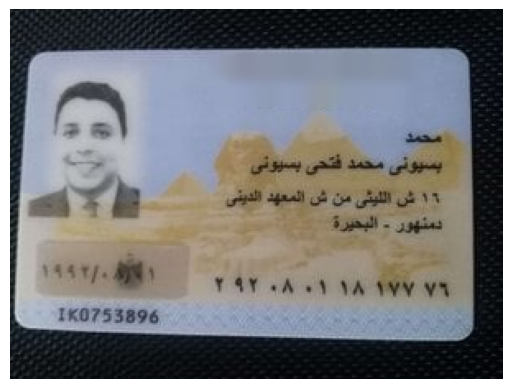

In [13]:
# Example
input_folder = 'input/15.jpg'
output_folder = 'output/15.jpg'
remove_logo(input_folder, output_folder)

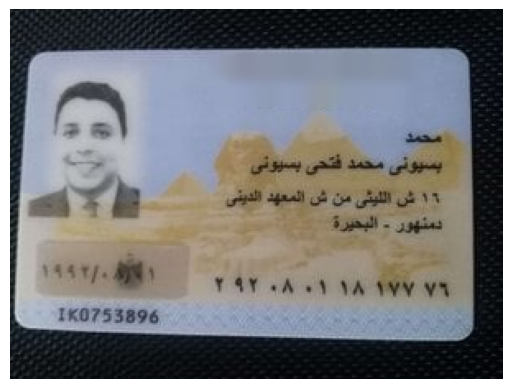

In [14]:
# Example
input_folder = 'input/15.jpg'
output_folder = '15.jpg'
remove_logo(input_folder, output_folder)

#### Test
- Run a test on the given images

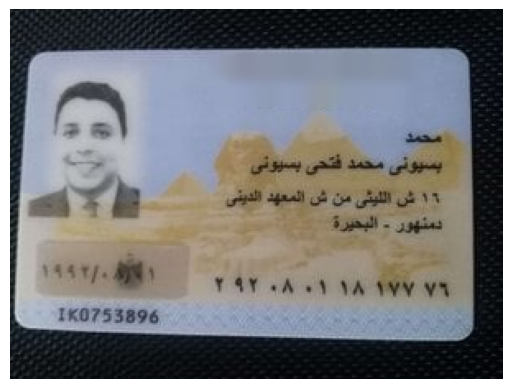

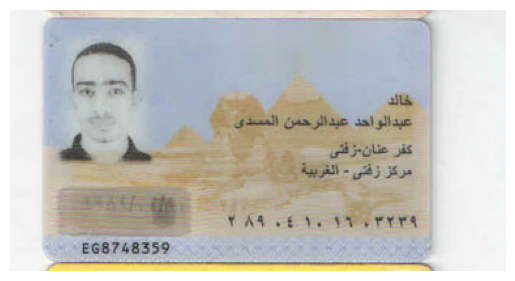

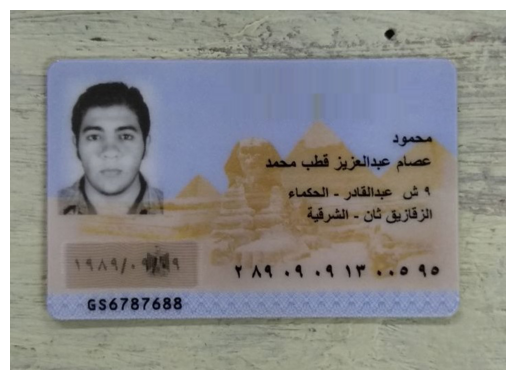

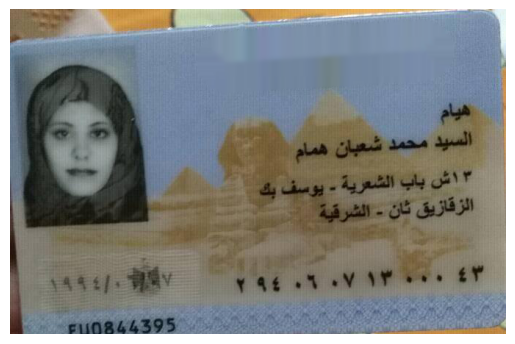

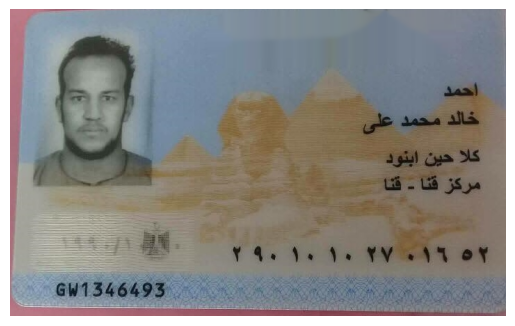

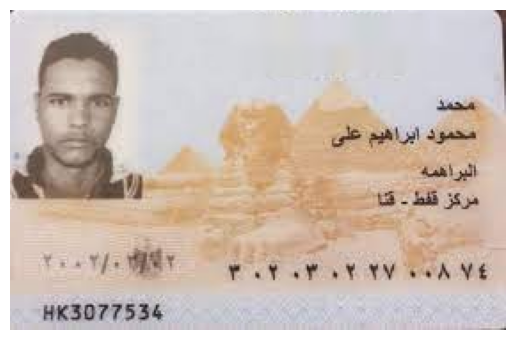

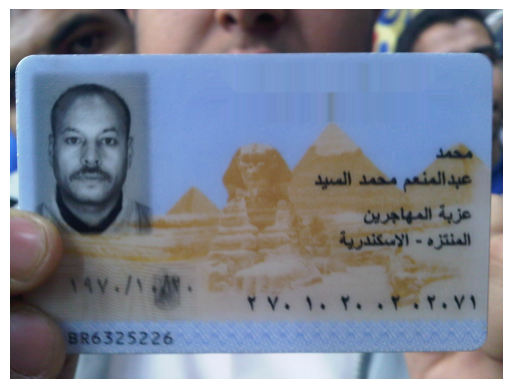

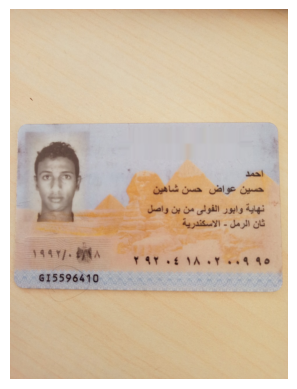

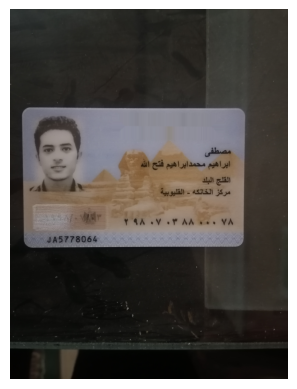

In [15]:
input_path = 'input'
output_path = 'output'

for filename in os.listdir(input_path):
    if filename.endswith(".jpg") or filename.endswith(".png"):
      remove_logo(os.path.join(input_path, filename), os.path.join(output_path, filename))

- Checking generalizability with another data set:
[Egyptian_ID's](https://www.kaggle.com/datasets/mostafaebrahiem/egyptian-ids?select=data_set)

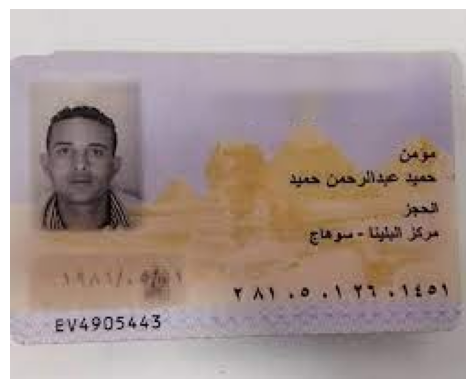

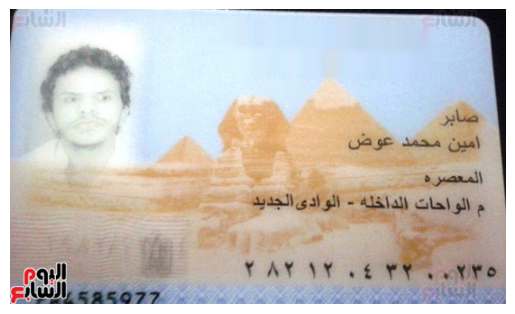

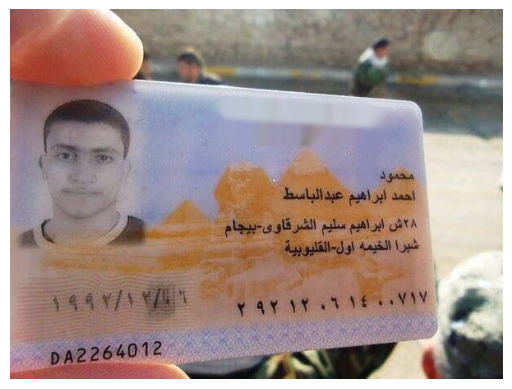

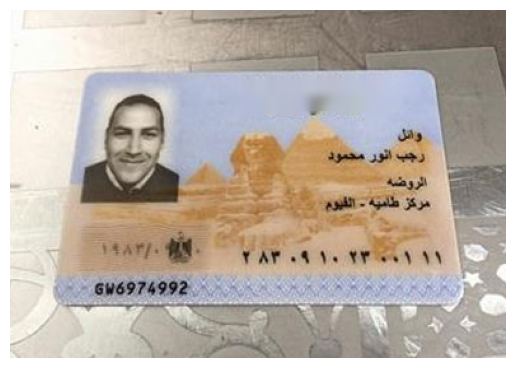

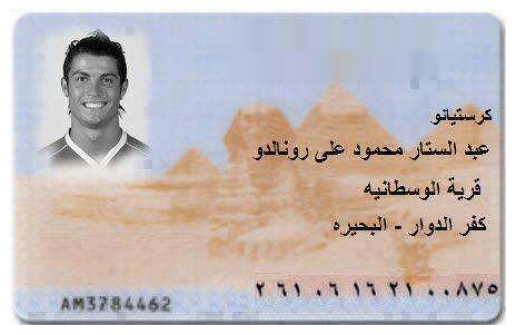

...

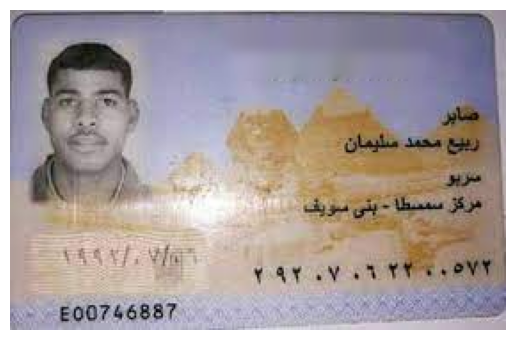

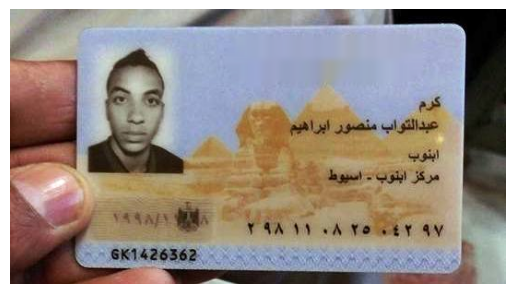

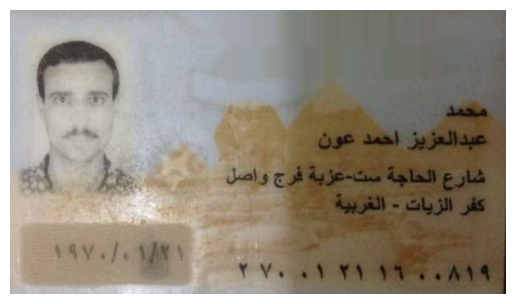

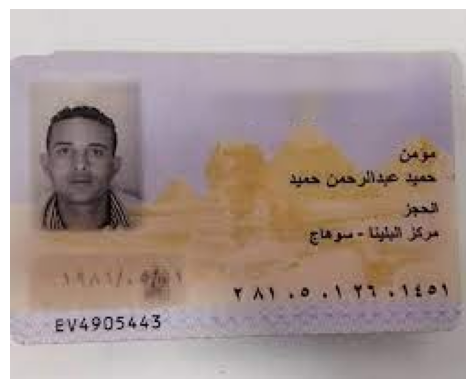

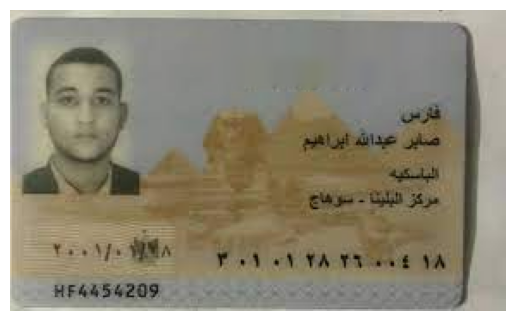

Not Enough Matches, try a larger image of the Logo


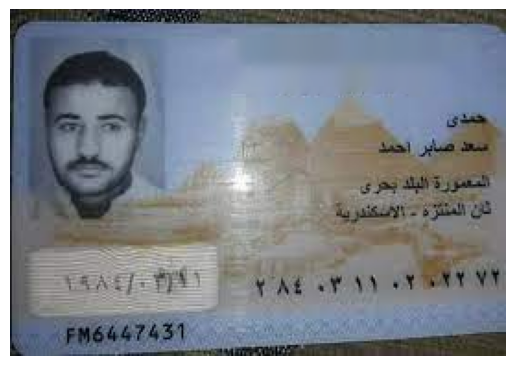

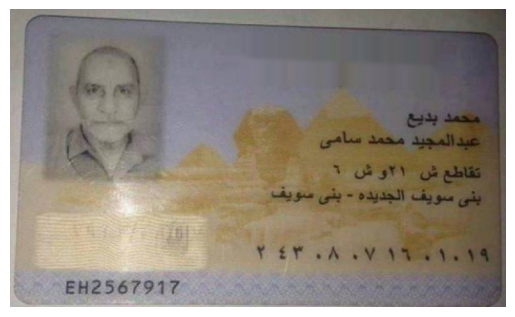

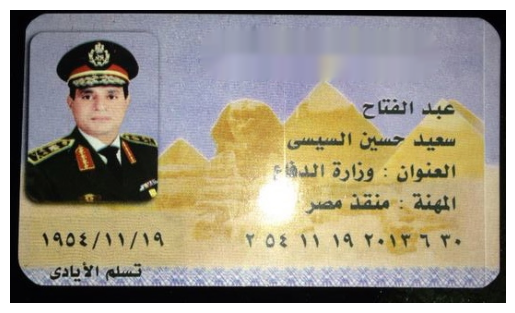

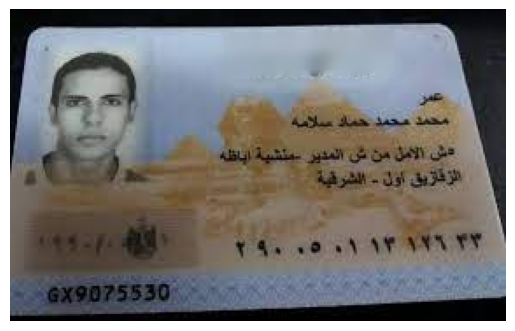

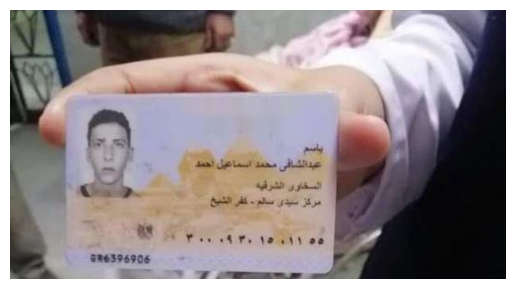

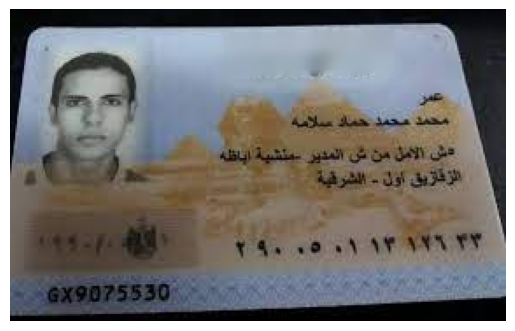

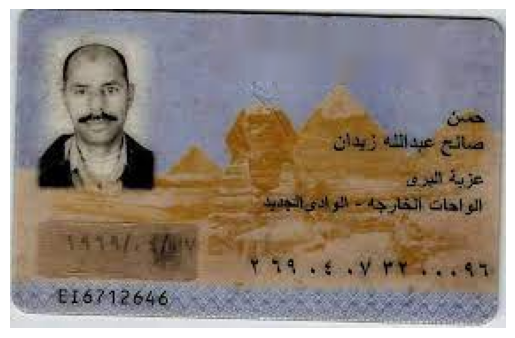

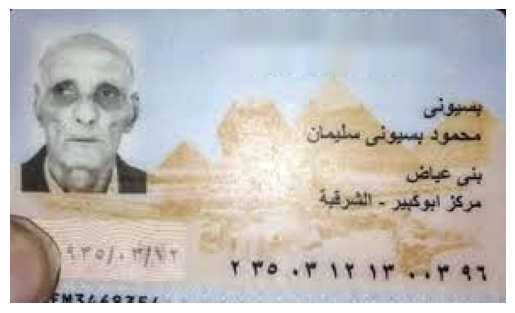

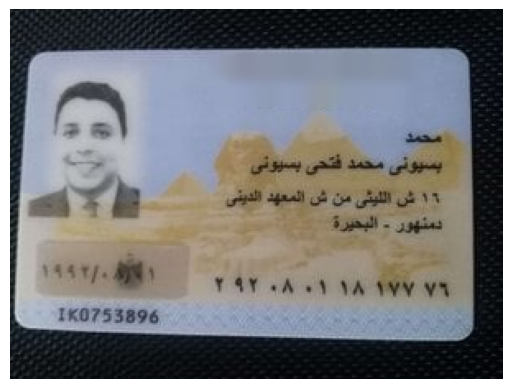

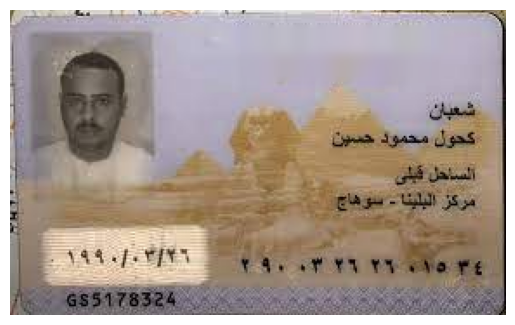

Not Enough Matches, try a larger image of the Logo


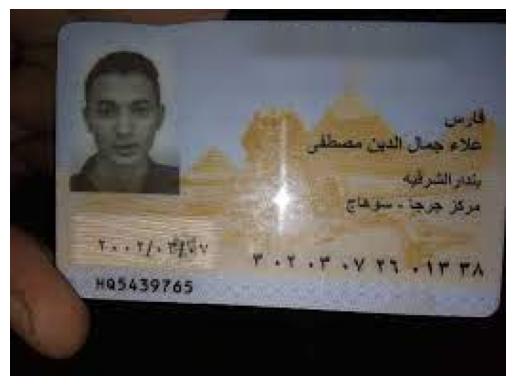

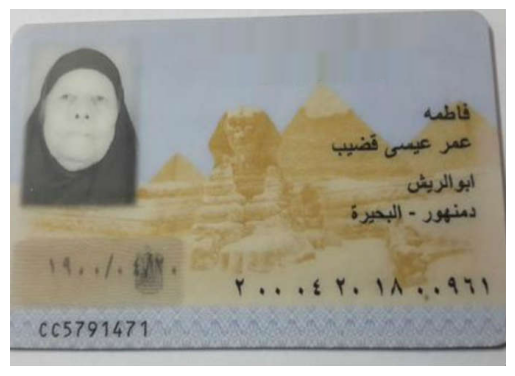

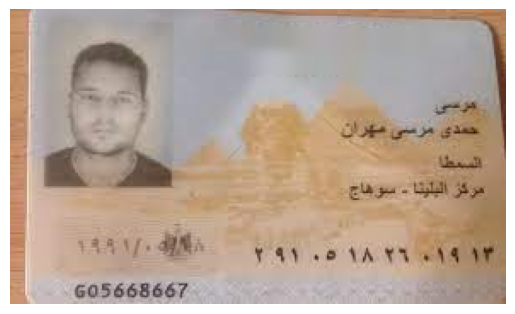

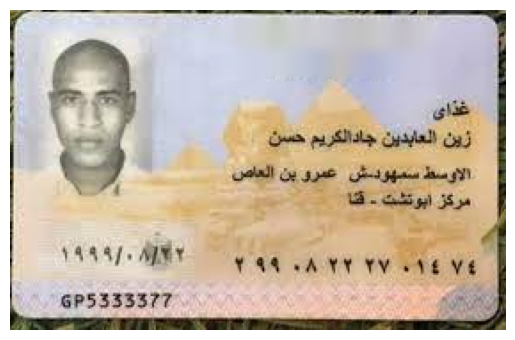

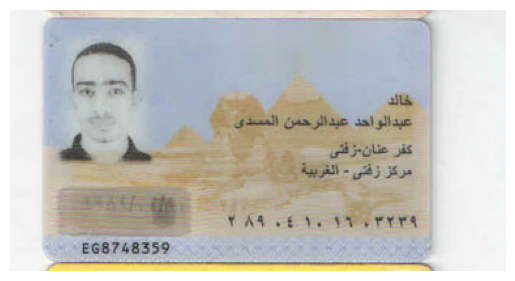

...

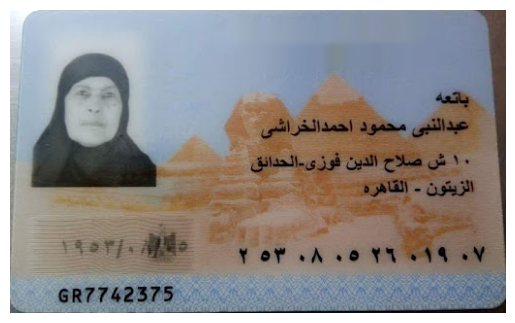

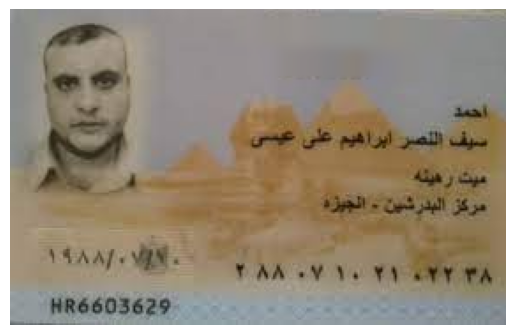

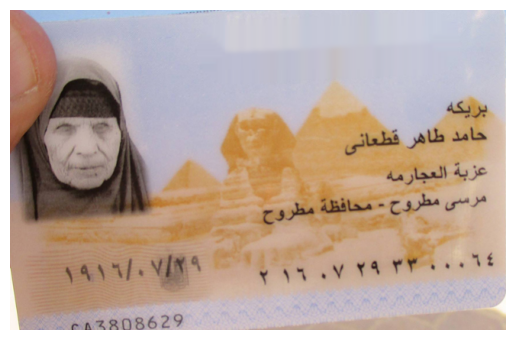

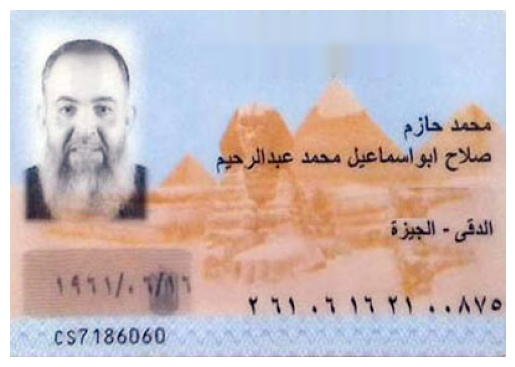

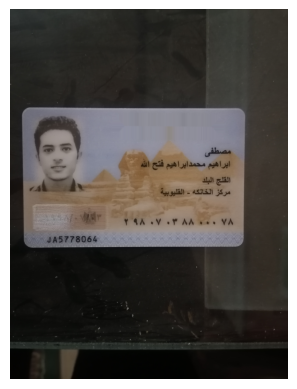

Not Enough Matches, try a larger image of the Logo


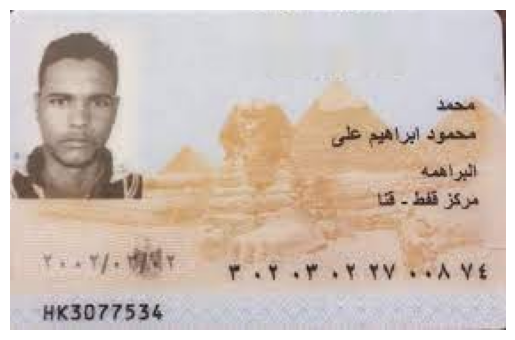

In [24]:
input_path = 'input2'
output_path = 'output2'

for filename in os.listdir(input_path):
    if filename.endswith(".jpg") or filename.endswith(".png"):
      remove_logo(os.path.join(input_path, filename), os.path.join(output_path, filename))

In [17]:
def count_images_in_folder(folder_path):
    if not os.path.exists(folder_path):
        raise FileNotFoundError(f"Folder not found: {folder_path}")

    image_files = glob.glob(os.path.join(folder_path, '*.jpg')) + glob.glob(os.path.join(folder_path, '*.jpeg')) + glob.glob(os.path.join(folder_path, '*.png')) + glob.glob(os.path.join(folder_path, '*.bmp')) + glob.glob(os.path.join(folder_path, '*.gif')) + glob.glob(os.path.join(folder_path, '*.tiff'))

    return len(image_files)


In [18]:
num_images = count_images_in_folder('input2')
num_images

58

In [25]:
num_images = count_images_in_folder('output2')
num_images

56

- Two images were not detected with the small logo, but if we tried a larger image for the logo, there will be enough matches to detect those images. However, the quality for inpainting won't be the best and thus need to apply it only when the first option fails.

In [20]:
input_folder = 'input2/42.jpg'
output_folder = 'output2/42.jpg'
remove_logo(input_folder, output_folder)

Not Enough Matches, try a larger image of the Logo


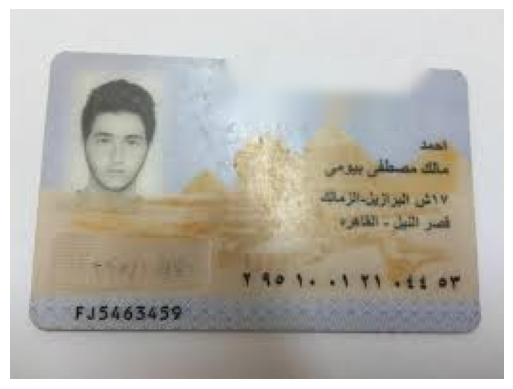

In [21]:
input_folder = 'input2/42.jpg'
output_folder = 'output2/42.jpg'
logo_path = 'Logo.PNG'
remove_logo(input_folder, output_folder, logo_path)

In [ ]:
input_path = 'input2'
output_path = 'output3'
logo_path = 'Logo.PNG'
for filename in os.listdir(input_path):
    if filename.endswith(".jpg") or filename.endswith(".png"):
      remove_logo(os.path.join(input_path, filename), os.path.join(output_path, filename), logo_path)

In [23]:
num_images = count_images_in_folder('output3')
num_images

58